In [1]:
import numpy as np
import time, os, sys
from urllib.parse import urlparse
import matplotlib.pyplot as plt
import matplotlib as mpl
%matplotlib inline
mpl.rcParams['figure.dpi'] = 300


import skimage.io
import cellpose
from skimage import data,io,filters # to use different filter on your image
from cellpose import utils, io, plot, models
import tkinter as Tk
from tkinter import* #generate dialogbox
from tkinter import filedialog
import glob  
import cv2 as cv # to open and view your image



2022-09-29 16:13:02,875 [INFO] WRITING LOG OUTPUT TO C:\Users\guiote\.cellpose\run.log


2022-09-29 16:13:31,296 [INFO] >>>> using CPU
C:\Users\guiote\Documents\Datas\Sirine\DataToProcess\DAPI
2022-09-29 16:13:42,987 [INFO] ~~~ FINDING MASKS ~~~
2022-09-29 16:14:05,391 [INFO] >>>> TOTAL TIME 22.40 sec


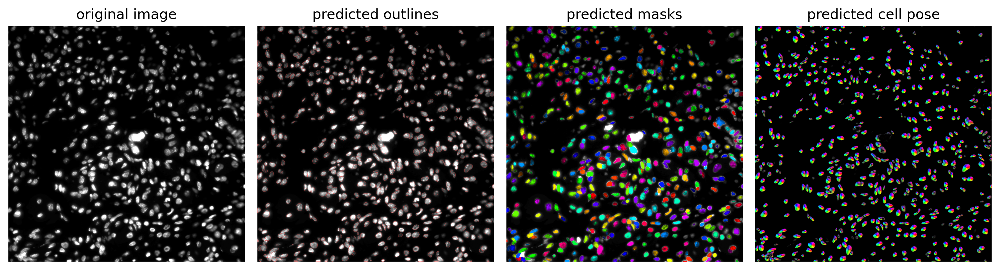

2022-09-29 16:14:24,901 [INFO] ~~~ FINDING MASKS ~~~
2022-09-29 16:14:48,057 [INFO] >>>> TOTAL TIME 23.16 sec


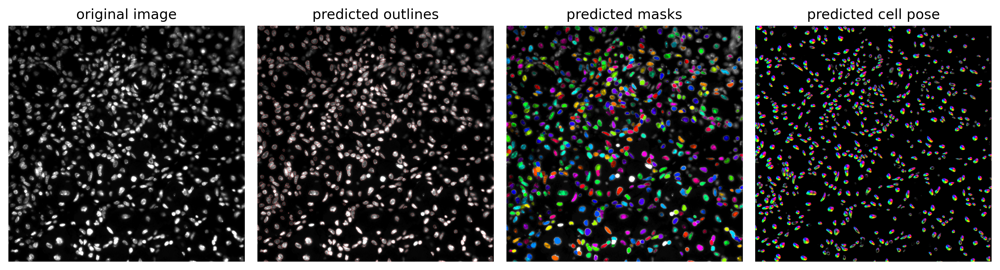

2022-09-29 16:15:13,810 [INFO] ~~~ FINDING MASKS ~~~
2022-09-29 16:15:42,911 [INFO] >>>> TOTAL TIME 29.10 sec


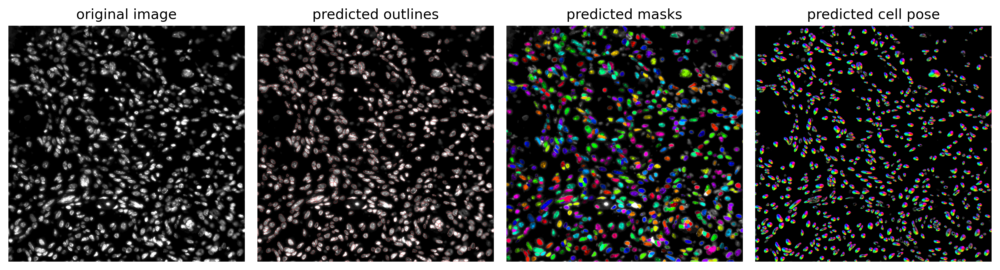

2022-09-29 16:16:10,063 [INFO] ~~~ FINDING MASKS ~~~
2022-09-29 16:16:41,630 [INFO] >>>> TOTAL TIME 31.57 sec


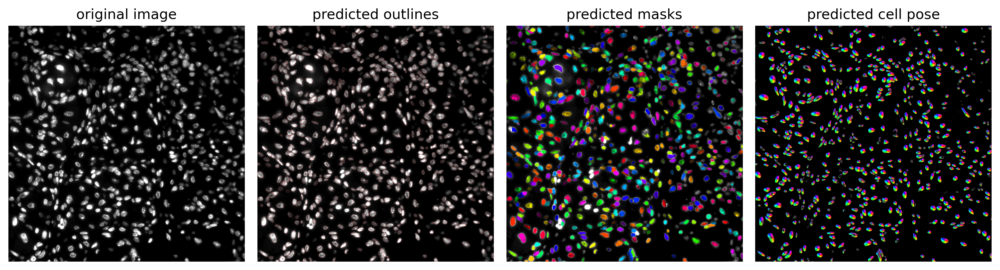

2022-09-29 16:17:07,898 [INFO] ~~~ FINDING MASKS ~~~
2022-09-29 16:17:37,194 [INFO] >>>> TOTAL TIME 29.29 sec


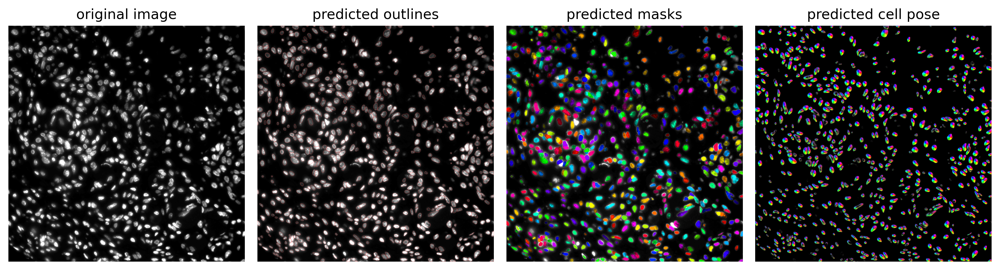

NameError: name 'pd' is not defined

In [2]:
# RUN CELLPOSE

from cellpose import models, io

# DEFINE CELLPOSE MODEL
# model_type='cyto' or model_type='nuclei'
# model = models.Cellpose(gpu=False, model_type='nuclei')

# define CHANNELS to run segementation on
# grayscale=0, R=1, G=2, B=3
# channels = [cytoplasm, nucleus]
# if NUCLEUS channel does not exist, set the second channel to 0
# channels = [0,0]
# IF ALL YOUR IMAGES ARE THE SAME TYPE, you can give a list with 2 elements
# channels = [0,0] # IF YOU HAVE GRAYSCALE
# channels = [2,3] # IF YOU HAVE G=cytoplasm and B=nucleus
# channels = [2,1] # IF YOU HAVE G=cytoplasm and R=nucleus

# or if you have different types of channels in each image
#channels = [[2,3], [0,0], [0,0]]
 

# model_type='cyto' or model_type='nuclei'
#model = models.Cellpose(model_type='cyto2')
# model with GPU
#use_GPU = models.use_gpu()
# if you would like to use run1net (fast), it's necessary to include this code 
#model = models.Cellpose(gpu=use_GPU, model_type='cyto2',net_avg=False)
#model = models.Cellpose(gpu=use_GPU, model_type='cyto2')
model = models.Cellpose(gpu=False, model_type='nuclei',net_avg=False)

#open dialog box to select the path
root = Tk()
root.title('open your files')
myDirectory=filedialog.askdirectory()
root.update()
path=myDirectory
path=os.path.realpath(path)
print (path)
img=cv.imread(path)
pathResult = path+'\Results'
if not os.path.exists(pathResult):
    os.makedirs(pathResult)



Impath = glob.glob(path+"/*.tif")
#cv_img = []
for img in Impath:
    imgs = cv.imread(img,0)
    
    
   # define CHANNELS to run segementation on
   # grayscale=0, R=1, G=2, B=3
   # channels = [cytoplasm, nucleus]
   # if NUCLEUS channel does not exist, set the second channel to 0
    channels = [0,0]
    
    # if diameter is set to None, the size of the cells is estimated on a per image basis
    # you can set the average cell `diameter` in pixels yourself (recommended)
    # diameter can be a list or a single number for all images

    masks, flows, styles, diams = model.eval(imgs, diameter=30, channels=channels)
    

    fig = plt.figure(figsize=(12,5))
    plot.show_segmentation(fig, imgs, masks,flows[0],channels=channels)
    plt.tight_layout()
    plt.show()
    
    # image_name is file name of image
    # masks is numpy array of masks for image
    base = os.path.splitext(img)[0]
    outlines = utils.outlines_list(masks)
    io.outlines_to_text(base, outlines)
    
    #plt.imshow(n)
    #io.imshow(n)
Roi= glob.glob(path+"/*.txt")
df= pd.DataFrame(columns=['Name','Value'])   
    #for file in Roi:
nRes = []
ImgName = []
for file in Roi:
    n = len(open(file).readlines())
    n=str(n)
    completeName = os.path.join(pathResult, "Result"+".txt")
    if not os.path.isfile(completeName):
        f = open(completeName,'w')
        f.close()
    name=os.path.basename(file) 
    fichier = open(completeName, "a")
    fichier.write('\n'+name+':'+n)
    fichier.close()
    nRes.append(n)
    ImgName.append(name)
    
      

    #plt.show()
root.destroy()

